In [179]:
"""
Import useful Libraries
"""

# Data manipulation
import pandas as pd

# Utils
import yaml
from types import SimpleNamespace
import os

In [180]:
# Read config file

# =-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=

# Name of experiment
EXP_NAME = "tourism"

# Read the configuration file (.yaml)
with open(f"../../configs/{EXP_NAME}.yaml", 'rb') as fout:
    config = yaml.safe_load(fout)

print(config)
for k, v in config.items():
    if type(v) == dict:
        config[k] = SimpleNamespace(**v)
config = SimpleNamespace(**config)
print(config)

OUTPUT = os.path.join(config.output, config.exp_name)
os.makedirs(OUTPUT, exist_ok=True)

# =-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=

{'exp_name': 'exp01_tourism', 'numOfOutboundTravellers': '/Users/dimitriosfotinos/Downloads/BOG/data/tourism/numberOfOutboundTravellers', 'reasonOfTravel': '/Users/dimitriosfotinos/Downloads/BOG/data/tourism/reasonOfTravel', 'incomeOfTravels': '/Users/dimitriosfotinos/Downloads/BOG/data/tourism/incomeOfTravels', 'overnightNonRes': '/Users/dimitriosfotinos/Downloads/BOG/data/tourism/overnightNonRes', 'expPerTravelNR': '/Users/dimitriosfotinos/Downloads/BOG/data/tourism/expPerTravelNR', 'expPerOvernightNR': '/Users/dimitriosfotinos/Downloads/BOG/data/tourism/expPerOvernightNR', 'avgDaysNR': '/Users/dimitriosfotinos/Downloads/BOG/data/tourism/avgDaysNR', 'balance': '/Users/dimitriosfotinos/Downloads/BOG/data/tourism/travelBalance', 'output': '/Users/dimitriosfotinos/Downloads/BOG/output'}
namespace(avgDaysNR='/Users/dimitriosfotinos/Downloads/BOG/data/tourism/avgDaysNR', balance='/Users/dimitriosfotinos/Downloads/BOG/data/tourism/travelBalance', expPerOvernightNR='/Users/dimitriosfotinos/

# Data imports

In [181]:
def readXLFiles(path):

    # Directory of excel files
    excel_files = [f for f in os.listdir(path) if f.endswith('.xls') or f.endswith('.xlsx')]

    # List of dataframes
    dataframes = []

    # Loop over excel files
    for file in excel_files:
        file_path = os.path.join(path, file)
        df = pd.read_excel(file_path, engine='openpyxl')
        dataframes.append(df)

    return dataframes[0]

In [182]:
# 2022-2023

# df NOOT = Number of Outbound Travellers (People <-)
dfNOOT  = readXLFiles(config.numOfOutboundTravellers)

# df ROT = Reason of Travel (Income <-)
dfROT   = readXLFiles(config.reasonOfTravel)

# df INC = Income (Income <-)
dfINC   = readXLFiles(config.incomeOfTravels)

# df OVRNR = Overnight (non Residents) (People <-)
dfOVR = readXLFiles(config.overnightNonRes)

# df EXPNR = Expenditure per Travel (non Residents) (Income <-)
dfEXPPT = readXLFiles(config.expPerTravelNR)

# df EXPOVR = Expenditure per Overnight (non Residents) (People <-)
dfEXPOVR = readXLFiles(config.expPerOvernightNR)

# df AVGD = Average Days of Stay (Days <-)
dfAVGD = readXLFiles(config.avgDaysNR)

# dfBLN = Balance of Payments (Income <-)
dfBLN = readXLFiles(config.balance)

In [183]:
dfINC

,From,To,EU_27_countries,Euro_area_countries,Austria,Belgium,France,Germany,Spain,Italy,...,Australia,Switzerland,United_Kingdom,USA,Canada,Russia,Cruises,TOTAL,Independent_travellers,Package_tours
0,2005-01-01,2005-03-31,339.200000,257.500000,6.5,6.5,15,82.300000,11,28.100000,...,8.2,14,44.6,50.9,7.7,14.1,:,617.000000,562.8,54.2
1,2005-04-01,2005-06-30,1521.400000,1289.600000,66.2,56.5,164.1,544.500000,15.5,128.100000,...,34.8,53.2,487.8,179.1,37.2,25.4,:,2570.500000,1650.8,919.7
2,2005-07-01,2005-09-30,3863.800000,3353.900000,244.5,182.3,390.9,1278.800000,71.7,637.500000,...,71.3,107.1,1194.9,335.6,62.5,64.7,:,6146.000000,4115.9,2030.1
3,2005-10-01,2005-12-31,794.900000,690.300000,18.5,36,47.3,329.700000,23.2,52.200000,...,18.5,39.4,205.5,108.6,31.4,25.9,:,1396.000000,1062.1,333.9
4,2006-01-01,2006-03-31,314.000000,249.600000,4.7,10.5,16.7,73.300000,10.4,31.000000,...,6.7,4.9,37,45,8.9,6.6,:,519.300000,478.7,40.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2021-10-01,2021-12-31,977.225080,869.104347,37.464244,27.38383,97.725883,456.479060,22.941814,39.167099,...,4.220828,62.73915,256.58945,121.441403,28.995379,45.251244,56.645699,1751.343234,1212.528929,538.814305
68,2022-01-01,2022-03-31,241.828083,195.736761,4.157453,11.192641,24.445016,65.599809,8.609249,11.865553,...,4.50105,7.284617,40.427752,33.74625,2.956675,5.968554,3.058072,447.463882,417.924721,29.539161
69,2022-04-01,2022-06-30,2622.046479,2191.195436,117.248361,112.967418,326.272015,969.158409,36.363968,167.665671,...,37.974338,116.451344,755.295198,305.290245,45.096828,8.665232,127.362116,4535.511517,3417.417385,1118.094132
70,2022-07-01,2022-09-30,6071.163963,4728.123231,305.322478,188.295988,816.617844,1806.809844,96.488285,616.638894,...,99.516386,219.23635,2027.427305,644.183942,140.014319,22.119453,190.697598,10576.821644,8207.444717,2369.376927


In [29]:
(411.117243 +463.026677)/2

437.07196

In [184]:
dfBLN

,From,To,Balance_of_travel_services,Travel_receipts,Travel_payments
0,2003-01-01,2003-03-31,119.400000,455.200000,335.800000
1,2003-04-01,2003-06-30,1864.600000,2405.200000,540.600000
2,2003-07-01,2003-09-30,4613.200000,5235.400000,622.200000
3,2003-10-01,2003-12-31,762.100000,1399.500000,637.400000
4,2004-01-01,2004-03-31,102.200000,522.200000,420.000000
...,...,...,...,...,...
75,2021-10-01,2021-12-31,1361.046405,1751.343234,390.296829
76,2022-01-01,2022-03-31,150.136811,447.463882,297.327072
77,2022-04-01,2022-06-30,3962.113272,4535.511517,573.398245
78,2022-07-01,2022-09-30,10024.282403,10576.821644,552.539241


In [185]:
dfNOOT

,From,To,EU_27_countries,Euro_area_countries,Austria,France,Germany,Spain,Italy,Cyprus,...,Czech_Republic,Other_countries,Egypt,United_Kingdom,USA,Russia,Turkey,TOTAL,Independent_travellers,Package_tours
0,2005-01-01,2005-03-31,567.500000,357.100000,27.400000,40.3,79.9,20.5,92.500000,44,...,45.5,426.000000,18.1,68.7,17.2,4.7,43.1,922.700000,760.100000,162.500000
1,2005-04-01,2005-06-30,570.100000,382.300000,19.100000,40,89.2,27.2,107.500000,46.1,...,20.2,445.200000,18.2,65.5,21.5,8,25,922.400000,837.600000,84.800000
2,2005-07-01,2005-09-30,656.700000,519.900000,26.600000,63.7,111,27.5,149.600000,56,...,15,406.100000,21.7,52.8,19.3,11.6,123.1,899.100000,766.900000,132.200000
3,2005-10-01,2005-12-31,595.400000,347.000000,20.400000,38.9,86.8,18.6,91.300000,34.3,...,14.4,365.600000,8.3,58.6,9.5,11.5,67.8,892.200000,810.600000,81.600000
4,2006-01-01,2006-03-31,562.000000,333.600000,26.000000,33.9,83.8,23.1,86.700000,39,...,23.4,375.300000,8.4,49,14.1,8.6,34.6,877.600000,759.500000,118.100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2021-10-01,2021-12-31,495.793357,343.555070,28.298603,31.841565,83.923572,17.974765,75.785483,26.013889,...,10.792952,365.765755,12.657355,50.356259,10.164451,4.016378,79.061796,828.135853,740.992466,87.143387
68,2022-01-01,2022-03-31,360.521478,251.349880,18.400570,19.443886,72.480501,13.675467,51.775832,40.093341,...,3.158986,333.223111,9.454994,39.682906,10.163424,6.636974,67.446573,667.195026,622.726850,44.468176
69,2022-04-01,2022-06-30,914.021592,600.919176,32.986632,65.334422,120.825815,34.760009,133.827649,105.100934,...,14.876912,676.999246,10.460375,66.317712,33.464077,(:),142.590769,1538.999388,1381.265450,157.733938
70,2022-07-01,2022-09-30,949.666653,494.444060,34.680354,61.231137,89.43229,52.9718,113.539739,72.87805,...,10.48364,552.498595,17.088771,77.660159,20.458159,1.166574,135.930757,1446.197598,1265.806727,180.390870


In [6]:
dfNOIT

,From,To,EU_27_countries,Euro_area_countries,Austria,France,Germany,Spain,Italy,Cyprus,...,Czech_Republic,Other_countries,Egypt,United_Kingdom,USA,Russia,Turkey,TOTAL,Independent_travellers,Package_tours
0,2005-01-01,2005-03-31,567.500000,357.100000,27.400000,40.3,79.9,20.5,92.500000,44,...,45.5,426.000000,18.1,68.7,17.2,4.7,43.1,922.700000,760.100000,162.500000
1,2005-04-01,2005-06-30,570.100000,382.300000,19.100000,40,89.2,27.2,107.500000,46.1,...,20.2,445.200000,18.2,65.5,21.5,8,25,922.400000,837.600000,84.800000
2,2005-07-01,2005-09-30,656.700000,519.900000,26.600000,63.7,111,27.5,149.600000,56,...,15,406.100000,21.7,52.8,19.3,11.6,123.1,899.100000,766.900000,132.200000
3,2005-10-01,2005-12-31,595.400000,347.000000,20.400000,38.9,86.8,18.6,91.300000,34.3,...,14.4,365.600000,8.3,58.6,9.5,11.5,67.8,892.200000,810.600000,81.600000
4,2006-01-01,2006-03-31,562.000000,333.600000,26.000000,33.9,83.8,23.1,86.700000,39,...,23.4,375.300000,8.4,49,14.1,8.6,34.6,877.600000,759.500000,118.100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2021-10-01,2021-12-31,495.793357,343.555070,28.298603,31.841565,83.923572,17.974765,75.785483,26.013889,...,10.792952,365.765755,12.657355,50.356259,10.164451,4.016378,79.061796,828.135853,740.992466,87.143387
68,2022-01-01,2022-03-31,360.521478,251.349880,18.400570,19.443886,72.480501,13.675467,51.775832,40.093341,...,3.158986,333.223111,9.454994,39.682906,10.163424,6.636974,67.446573,667.195026,622.726850,44.468176
69,2022-04-01,2022-06-30,914.021592,600.919176,32.986632,65.334422,120.825815,34.760009,133.827649,105.100934,...,14.876912,676.999246,10.460375,66.317712,33.464077,(:),142.590769,1538.999388,1381.265450,157.733938
70,2022-07-01,2022-09-30,949.666653,494.444060,34.680354,61.231137,89.43229,52.9718,113.539739,72.87805,...,10.48364,552.498595,17.088771,77.660159,20.458159,1.166574,135.930757,1446.197598,1265.806727,180.390870


In [7]:
dfROT

,From,To,Personal_purposes,Leisure,Studies,Health,Visit_to_family,Other_reasons,Business_purposes,TOTAL
0,2005-01-01,2005-03-31,420.500000,186.000000,74.600000,4.200000,115.900000,39.800000,196.400000,617.000000
1,2005-04-01,2005-06-30,2301.800000,1985.100000,84.100000,15.300000,139.100000,78.200000,268.700000,2570.500000
2,2005-07-01,2005-09-30,5915.200000,5289.200000,65.400000,22.400000,353.200000,185.100000,230.800000,6146.000000
3,2005-10-01,2005-12-31,1148.900000,884.700000,62.300000,5.900000,120.600000,75.400000,247.100000,1396.000000
4,2006-01-01,2006-03-31,355.400000,163.700000,63.100000,3.200000,77.600000,47.800000,164.000000,519.400000
...,...,...,...,...,...,...,...,...,...,...
67,2021-10-01,2021-12-31,1603.674301,1356.840014,33.221546,3.973471,189.999350,19.639921,147.668933,1751.343234
68,2022-01-01,2022-03-31,343.877494,192.936173,32.968451,7.576815,86.670299,23.725756,103.586388,447.463882
69,2022-04-01,2022-06-30,4282.525746,3842.615482,98.027301,13.071458,253.920669,74.890835,252.985772,4535.511517
70,2022-07-01,2022-09-30,10259.554700,9521.813905,53.716235,21.331957,537.553760,125.138843,317.266945,10576.821644


In [22]:
dfOVRR

,From,To,EU_27_countries,Euro_area_countries,Austria,France,Germany,Spain,Italy,Cyprus,...,Czech_Republic,Other_countries,Egypt,United_Kingdom,USA,Russia,Turkey,TOTAL,Independent_travellers,Package_tours
0,2005-01-01,2005-03-31,3685.100000,2745.400000,126.7,241.8,775.100000,120.1,643.200000,101.6,...,252.6,5124.400000,236.4,1097.1,345,94.5,179.5,8809.500000,8176.400000,633.100000
1,2005-04-01,2005-06-30,3883.200000,3066.800000,93.9,281.1,934.100000,226.4,676.000000,122.2,...,140.8,4917.800000,225.6,1465.9,585.2,112.4,195.4,8800.900000,8363.700000,437.300000
2,2005-07-01,2005-09-30,4270.300000,3426.900000,102.3,353.4,931.900000,160.2,659.100000,146.8,...,55,4028.100000,287.1,795.3,460.4,127.5,517.9,8298.400000,7436.700000,861.700000
3,2005-10-01,2005-12-31,4109.100000,2991.300000,124,391.4,789.300000,201.6,679.900000,147.5,...,59,4096.500000,144.7,1227.5,256.4,221.3,366.6,8205.700000,7828.700000,377.000000
4,2006-01-01,2006-03-31,3870.500000,2890.400000,123.3,206.2,746.100000,129.2,985.200000,93.7,...,80.8,4497.400000,129.7,720.9,230,137.4,186.9,8367.900000,7922.800000,445.100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2021-10-01,2021-12-31,3879.386812,2988.238863,145.020932,300.987604,867.308486,139.395123,424.746320,229.160072,...,91.96874,2929.308734,178.715264,768.436039,203.581338,92.01169,305.03213,6808.695546,6379.781787,428.913759
68,2022-01-01,2022-03-31,4173.275073,3514.448086,212.329739,170.308276,965.407852,204.537255,316.539742,1032.682435,...,251.232248,3355.257867,190.20202,966.416183,369.760166,162.689632,270.098991,7528.532939,7271.549776,256.983164
69,2022-04-01,2022-06-30,6389.218151,5201.688347,224.056655,478.883864,977.915311,371.391624,691.215573,1487.889187,...,96.045753,4218.446037,227.67402,769.5944,723.761471,(:),382.456126,10607.664188,9532.469919,1075.194269
70,2022-07-01,2022-09-30,4906.694820,3855.297994,215.566546,382.485583,877.156530,416.67535,670.319991,818.322769,...,82.121123,4368.309611,314.638863,761.189408,501.415761,37.013367,363.388855,9275.004431,8153.948503,1121.055927


In [186]:
# Define the data
data = {
    'Action': ['Hotels', 'Restaurants', 'Arts and culture', 'Outdoors', 'Night', 'Cruises', 'Luxury Services', 'Outdoor'],
    'Frequency': [32, 17, 10, 10, 10, 10, 10, 1]
}

# Create the DataFrame
df = pd.DataFrame(data)

In [187]:
df

,Action,Frequency
0,Hotels,32
1,Restaurants,17
2,Arts and culture,10
3,Outdoors,10
4,Night,10
5,Cruises,10
6,Luxury Services,10
7,Outdoor,1


In [188]:
import plotly.express as px
import plotly.graph_objects as go
# Sort the DataFrame by 'Frequency' in ascending order


# Sort the DataFrame by 'Frequency' in ascending order
df = df.sort_values('Frequency', ascending=False)

# Create the bar plot using Plotly Express
fig = px.bar(df, x='Action', y='Frequency', title='Frequency of Actions')

# Update the y-axis range, ticks, and title
fig.update_yaxes(title='Score %')

# Show the plot
fig.show()

In [189]:
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import fiona

# # Load the shapefile of Greece
# fp = "path/to/your/shapefile/GRC_adm1.shp"
# greece = gpd.read_file(fp)

# # Create a sample data for heatmap
# import numpy as np
# np.random.seed(42)  # for consistent results
# greece["value"] = np.random.rand(len(greece))

# # Plot the heatmap
# fig, ax = plt.subplots(1, figsize=(10, 6))
# greece.plot(column='value', cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
# ax.axis('off')
# plt.title('Heatmap of Greece')
# plt.show()

In [103]:
# Specify the path to your .shp and .shx files
shp_file_path = "gr_10km.shp"
shx_file_path = "gr_10km.shx"

# Create a new .shx file using the .shp file
with fiona.open(shp_file_path) as src:
    meta = src.meta
    with fiona.open(shx_file_path, 'w', **meta) as dst:
        for feature in src:
            dst.write(feature)

In [99]:
pwd

'/Users/dimitriosfotinos/Downloads/BOG/nbs/tourism'

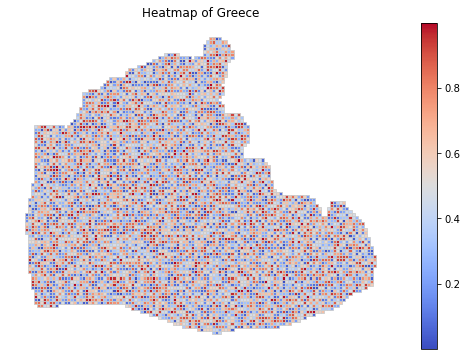

In [104]:
# Load the shapefile of Greece
fp = "gr_10km.shp"
greece = gpd.read_file(fp)

# Create a sample data for heatmap
import numpy as np
np.random.seed(42)  # for consistent results
greece["value"] = np.random.rand(len(greece))

# Plot the heatmap
fig, ax = plt.subplots(1, figsize=(10, 6))
greece.plot(column='value', cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.axis('off')
plt.title('Heatmap of Greece')
plt.show()

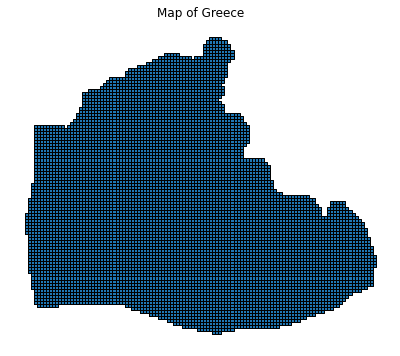

In [105]:
# Load the shapefile of Greece
fp = "gr_10km.shp"
greece = gpd.read_file(fp)

# Plot the map
fig, ax = plt.subplots(1, figsize=(10, 6))
greece.plot(ax=ax, edgecolor='black')
ax.axis('off')
plt.title('Map of Greece')
plt.show()

In [190]:
dfper = pd.read_csv("/Users/dimitriosfotinos/Downloads/BOG/nbs/tourism/d7f50467-e5ef-49ac-a7ce-15df3e2ed738.csv")

In [191]:
dfper

,FID,PER,the_geom
0,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.0,Π. ΑΝΑΤΟΛΙΚΗΣ ΜΑΚΕΔΟΝΙΑΣ - ΘΡΑΚΗΣ,MULTIPOLYGON (((468363.1888747929 4577898.9977...
1,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.1,Π. ΚΕΝΤΡΙΚΗΣ ΜΑΚΕΔΟΝΙΑΣ,MULTIPOLYGON (((306365.3789626242 4525842.9980...
2,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.2,Π. ΔΥΤΙΚΗΣ ΜΑΚΕΔΟΝΙΑΣ,MULTIPOLYGON (((226087.98859465955 4471633.998...
3,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.3,Π. ΗΠΕΙΡΟΥ,MULTIPOLYGON (((157581.7769532121 4400827.9984...
4,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.4,Π. ΘΕΣΣΑΛΙΑΣ,MULTIPOLYGON (((252882.0489475104 4395793.9983...
5,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.5,Π. ΒΟΡΕΙΟΥ ΑΙΓΑΙΟΥ,MULTIPOLYGON (((583302.4390333116 4372793.4980...
6,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.6,Π. ΝΟΤΙΟΥ ΑΙΓΑΙΟΥ,MULTIPOLYGON (((511410.30942229135 4039985.998...
7,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.7,Π. ΣΤΕΡΕΑΣ ΕΛΛΑΔΑΣ,MULTIPOLYGON (((272558.24912843585 4321865.998...
8,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.8,Π. ΔΥΤΙΚΗΣ ΕΛΛΑΔΑΣ,MULTIPOLYGON (((245118.96917121936 4192904.498...
9,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.9,Π. ΠΕΛΟΠΟΝΝΗΣΟΥ,MULTIPOLYGON (((281006.99940546777 4103543.998...


In [192]:
import geopandas as gpd
from shapely.wkt import loads

<AxesSubplot:>

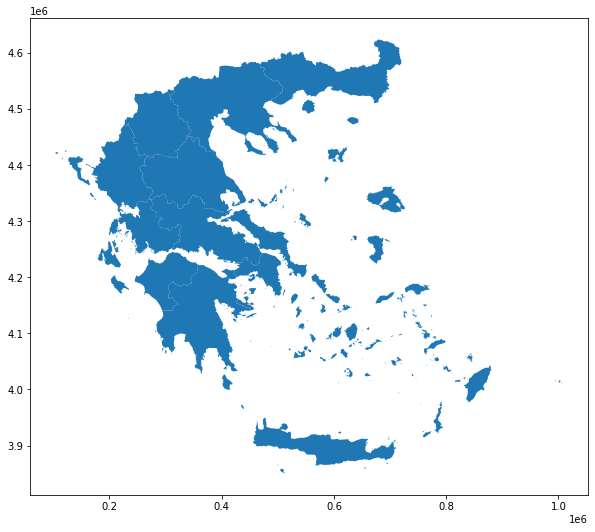

In [143]:
# Convert the 'geometry' column to shapely geometry objects
dfper['the_geom'] = dfper['the_geom'].apply(loads)

# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(dfper, geometry='the_geom')

# Plot the GeoDataFrame
gdf.plot(figsize=(10, 10))

In [193]:
dfper['value'] = 0

In [194]:
# put in the column value, numbers from 1 to 13
dfper['value'] = range(1, len(dfper) + 1)


In [134]:
dfper.drop('value_0', axis=1, inplace=True)

In [161]:
dfper

,FID,PER,the_geom,value
0,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.0,Π. ΑΝΑΤΟΛΙΚΗΣ ΜΑΚΕΔΟΝΙΑΣ - ΘΡΑΚΗΣ,MULTIPOLYGON (((468363.1888747929 4577898.9977...,1
1,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.1,Π. ΚΕΝΤΡΙΚΗΣ ΜΑΚΕΔΟΝΙΑΣ,MULTIPOLYGON (((306365.3789626242 4525842.9980...,2
2,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.2,Π. ΔΥΤΙΚΗΣ ΜΑΚΕΔΟΝΙΑΣ,MULTIPOLYGON (((226087.98859465955 4471633.998...,3
3,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.3,Π. ΗΠΕΙΡΟΥ,MULTIPOLYGON (((157581.7769532121 4400827.9984...,4
4,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.4,Π. ΘΕΣΣΑΛΙΑΣ,MULTIPOLYGON (((252882.0489475104 4395793.9983...,5
5,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.5,Π. ΒΟΡΕΙΟΥ ΑΙΓΑΙΟΥ,MULTIPOLYGON (((583302.4390333116 4372793.4980...,6
6,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.6,Π. ΝΟΤΙΟΥ ΑΙΓΑΙΟΥ,MULTIPOLYGON (((511410.30942229135 4039985.998...,7
7,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.7,Π. ΣΤΕΡΕΑΣ ΕΛΛΑΔΑΣ,MULTIPOLYGON (((272558.24912843585 4321865.998...,8
8,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.8,Π. ΔΥΤΙΚΗΣ ΕΛΛΑΔΑΣ,MULTIPOLYGON (((245118.96917121936 4192904.498...,9
9,d7f50467-e5ef-49ac-a7ce-15df3e2ed738.9,Π. ΠΕΛΟΠΟΝΝΗΣΟΥ,MULTIPOLYGON (((281006.99940546777 4103543.998...,10


In [136]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

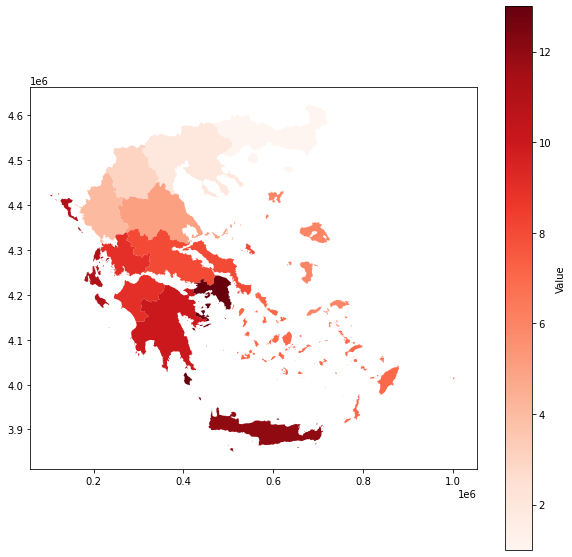

In [195]:
# Convert the 'geometry' column to shapely geometry objects
dfper['the_geom'] = dfper['the_geom'].apply(loads)

# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(dfper, geometry='the_geom')

# Create a colormap
cmap = plt.get_cmap("Reds")

# Normalize the values to the range [0, 1]
norm = mcolors.Normalize(vmin=dfper["value"].min(), vmax=dfper["value"].max())

# Plot the GeoDataFrame with colors based on the "value" column
ax = gdf.plot(column='value', cmap=cmap, figsize=(10, 10))

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Value')

plt.show()

In [196]:
import branca.colormap as bcm

In [197]:
import geopandas as gpd
import folium
from shapely.wkt import loads

# # Convert the 'geometry' column to shapely geometry objects
# dfper['the_geom'] = dfper['the_geom'].apply(loads)


# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(dfper, geometry='the_geom')

# Set the original CRS of the GeoDataFrame
gdf.crs = "EPSG:3857"

# Reproject the GeoDataFrame to the EPSG:4326 coordinate reference system
gdf = gdf.to_crs(epsg=4326)

# Calculate the map's center
center = gdf.geometry.centroid.unary_union.centroid

# Create a folium map
m = folium.Map(location=[center.y, center.x], zoom_start=7, tiles="cartodb positron")

# Create a colormap
cmap = bcm.LinearColormap(colors=["white", "red"], vmin=dfper["value"].min(), vmax=dfper["value"].max())

# Function to style each polygon
def style_function(feature):
    value = feature["properties"]["value"]
    return {
        "fillOpacity": 0.5,
        "fillColor": cmap(value),
        "color": "black",
        "weight": 1,
    }

# Add polygons to the map
folium.GeoJson(
    gdf.to_json(),
    style_function=style_function,
    tooltip=folium.features.GeoJsonTooltip(fields=["PER"], labels=True, sticky=True),
).add_to(m)

# Add the colormap to the map
cmap.caption = "Value"
cmap.add_to(m)

# Display the map
m

<ipython-input-197-fac33feb1928>:19: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


